In [1]:
import glob
import os
from lsst import afw
#print(afw.version.__version__)
from lsst.daf.persistence import Butler
from lsst.eotest.sensor import MaskedCCD, makeAmplifierGeometry

from exploreRun import exploreRun
from lsst.eo_utils.base.image_utils import get_ccd_from_id,\
    get_amp_list, get_data_as_read, sort_sflats

from lsst.eo_utils.base.data_access import get_data_for_run

import lsst.eotest.image_utils as imutil
import pylab

from astropy.io import fits
from astropy.stats import mad_std

import scipy
from scipy import signal
from scipy.fftpack import fft, fftshift

import math
from scipy.ndimage import gaussian_filter

from mytool import plotonesensor_ITL, plotonesensor_ITL_smooth, create_combined_ITL
import numpy as np
import numpy

import matplotlib.pyplot as plt

%matplotlib inline

20.0.0-4-gde602ef96+5


In [2]:
# Just use plt.subplots(3,3) and order them correctly 

# bottom row
superbiaspath_S00 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S00_superbias_normal.fits" # bottom left
superdarkpath_S00 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S00_superdark_normal.fits"
qeflatpath_S00 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S00/*_lambda_flat_*")

superbiaspath_S01 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S01_superbias_normal.fits"
superdarkpath_S01 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S01_superdark_normal.fits"
qeflatpath_S01 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S01/*_lambda_flat_*")

superbiaspath_S02 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S02_superbias_normal.fits"
superdarkpath_S02 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S02_superdark_normal.fits"
qeflatpath_S02 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S02/*_lambda_flat_*")

# middle row
superbiaspath_S10 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S10_superbias_normal.fits"
superdarkpath_S10 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S10_superdark_normal.fits"
qeflatpath_S10 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S10/*_lambda_flat_*")

superbiaspath_S11 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S11_superbias_normal.fits"
superdarkpath_S11 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S11_superdark_normal.fits"
qeflatpath_S11 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S11/*_lambda_flat_*")

superbiaspath_S12 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S12_superbias_normal.fits"
superdarkpath_S12 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S12_superdark_normal.fits"
qeflatpath_S12 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S12/*_lambda_flat_*")

# top row
superbiaspath_S20 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S20_superbias_normal.fits"
superdarkpath_S20 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S20_superdark_normal.fits"
qeflatpath_S20 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S20/*_lambda_flat_*")

superbiaspath_S21 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S21_superbias_normal.fits"
superdarkpath_S21 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S21_superdark_normal.fits"
qeflatpath_S21 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S21/*_lambda_flat_*")

superbiaspath_S22 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-013/RTM-013-10982-S22_superbias_normal.fits"  # top right
superdarkpath_S22 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-013/RTM-013-10982-S22_superdark_normal.fits" 
qeflatpath_S22 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-013/10982/qe_raft_acq/v0/85192/S22/*_lambda_flat_*")

# list of file path for each sensor, will use to create combined images
superbiaspath_list = [superbiaspath_S20, superbiaspath_S21, superbiaspath_S22, superbiaspath_S10, superbiaspath_S11, superbiaspath_S12, superbiaspath_S00, superbiaspath_S01, superbiaspath_S02]
superdarkpath_list = [superdarkpath_S20, superdarkpath_S21, superdarkpath_S22, superdarkpath_S10, superdarkpath_S11, superdarkpath_S12, superdarkpath_S00, superdarkpath_S01, superdarkpath_S02]
qeflatpath_list = [qeflatpath_S20, qeflatpath_S21, qeflatpath_S22, qeflatpath_S10, qeflatpath_S11, qeflatpath_S12, qeflatpath_S00, qeflatpath_S01, qeflatpath_S02]

In [3]:
wavelengths_list = [365, 466.6, 622.6, 759.9, 845.7, 950.5]
width_of_wavelength_list = [12, 25, 18, 28, 32, 60]
width_of_wavelength_list_converted = []
for num in width_of_wavelength_list:
    z = num / 2.355
    width_of_wavelength_list_converted.append(z)
mu = wavelengths_list[2]     # RED band
sigma = width_of_wavelength_list_converted[2]
a = 1    # to normalize
x = numpy.arange(300,1100,1)  
y = a*numpy.exp(-(x-mu)**2/(2*sigma**2))

wls_list = []
weights_list = []
num_CCDs = 9
for i in range(num_CCDs):
    qeflatpath_list[i].sort()
    # array of wavelengths
    wls = numpy.array([ get_ccd_from_id(None, aqeflatpath, []).md.md["MONOWL"] for aqeflatpath in qeflatpath_list[i]])
    wls_list.append(wls)
    # 
    weights = numpy.interp(wls, x, y)
    weights_list.append(weights)

In [4]:
# loading all 9 CCOB filepaths
fnameS00= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S00_red_-296.285_-42.865.fits"
fnameS01= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S01_red_-296.415_-0.585.fits"
fnameS02= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S02_red_-296.465_41.685.fits"
fnameS10= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S10_red_-254.015_-42.815.fits"
fnameS11= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S11_red_-254.095_-0.495.fits"
fnameS12= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S12_red_-254.195_41.785.fits"
fnameS20= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S20_red_-211.735_-42.685.fits"
fnameS21= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S21_red_-211.815_-0.395.fits" 
fnameS22= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R02_S22_red_-211.895_41.865.fits"

file_list = [fnameS20, fnameS21, fnameS22, fnameS10, fnameS11, fnameS12, fnameS00, fnameS01, fnameS02]

def create_ccob(img_list, i):
    num_ch = 16
    red_arr = [None] * num_ch
    normedimg_arr = [None] * num_ch
    MEDIAN = None

    fname = file_list[i]     
    ccob_red = get_ccd_from_id(None, file_list[i], [])

    # reading in files in CCOB testing at red LED for each of 16 channels 
    for ch in range(num_ch):    
        red = get_data_as_read(ccob_red,ch + 1,["imaging"])["imaging"]    # QE data array for CCOBr flat field image
        MEDIAN = numpy.median(red)                                        # median (not mean, avoiding outliers) of QE data array for CCOBr, will normalize COMBINED with this
        normedimg = img_list[ch] / numpy.median(img_list[ch]) * MEDIAN    # normalizing COMBINED against the CCOB amp-by-amp to the level of the CCOB median 
        normedimg_arr[ch] = normedimg                                     # adding data at this amp to data array
        red_arr[ch] = red
    return normedimg_arr, red_arr

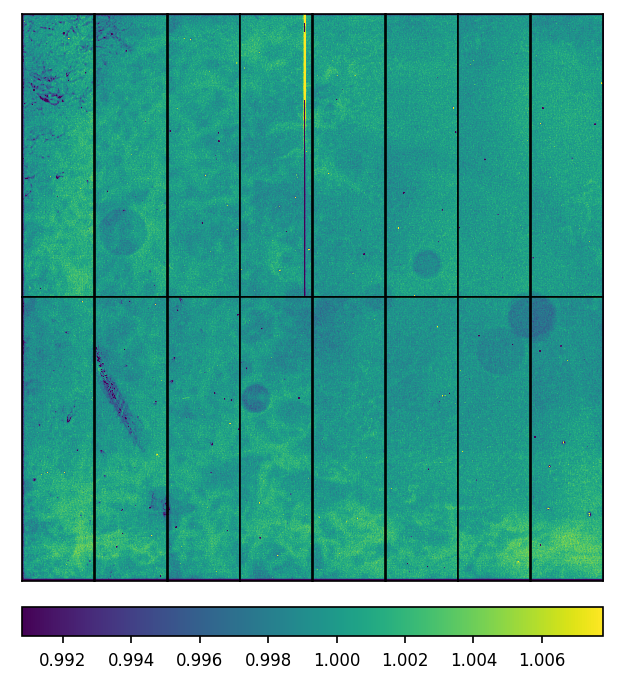

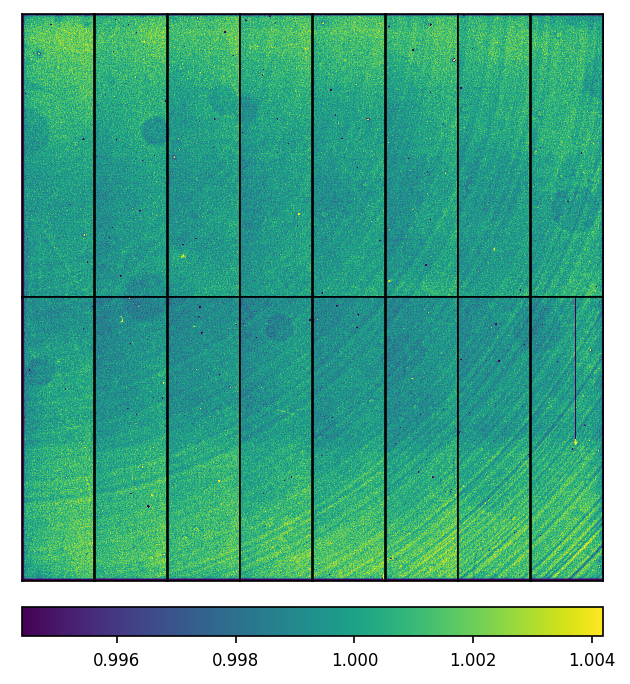

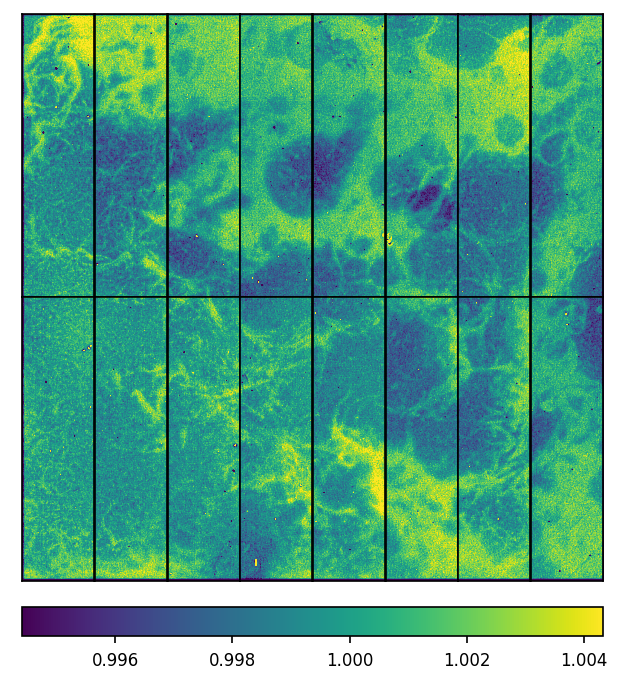

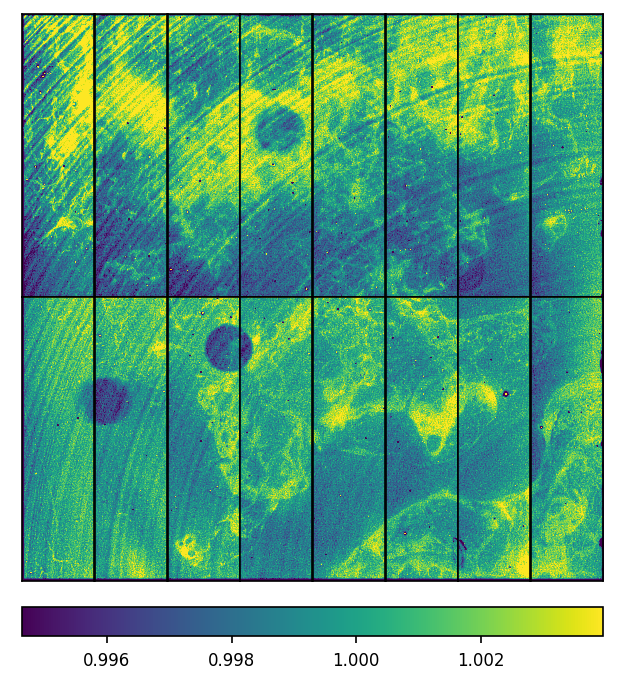

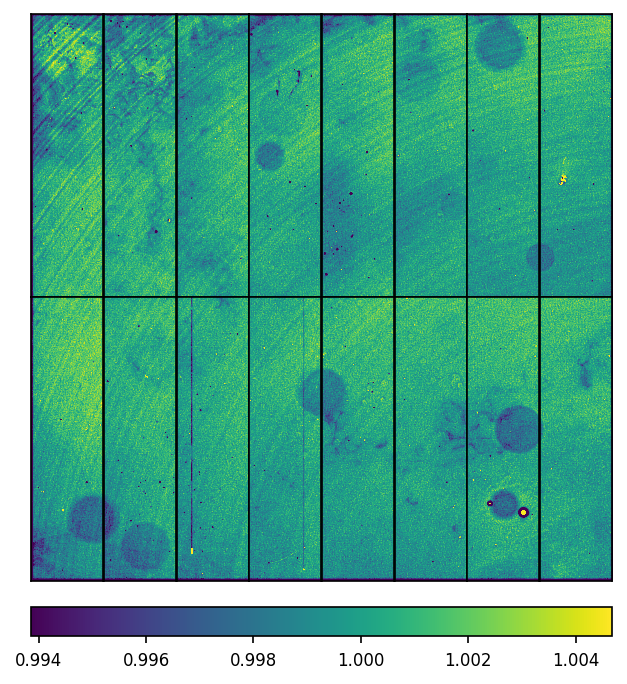

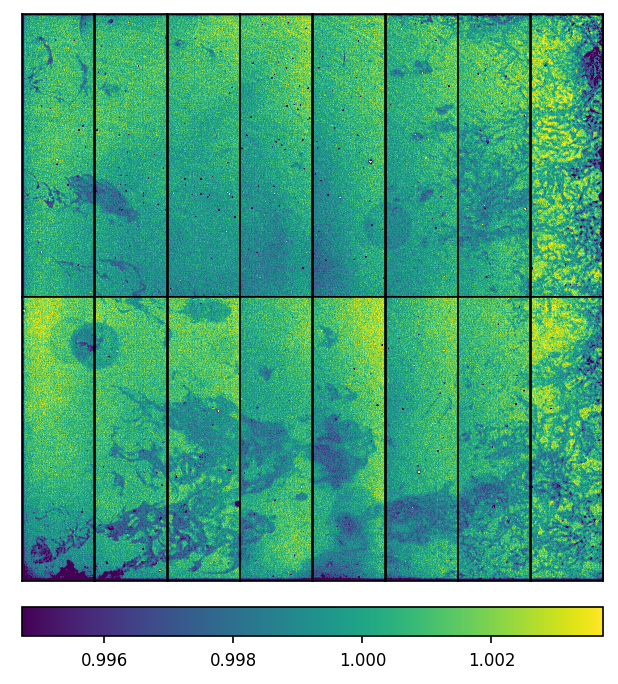

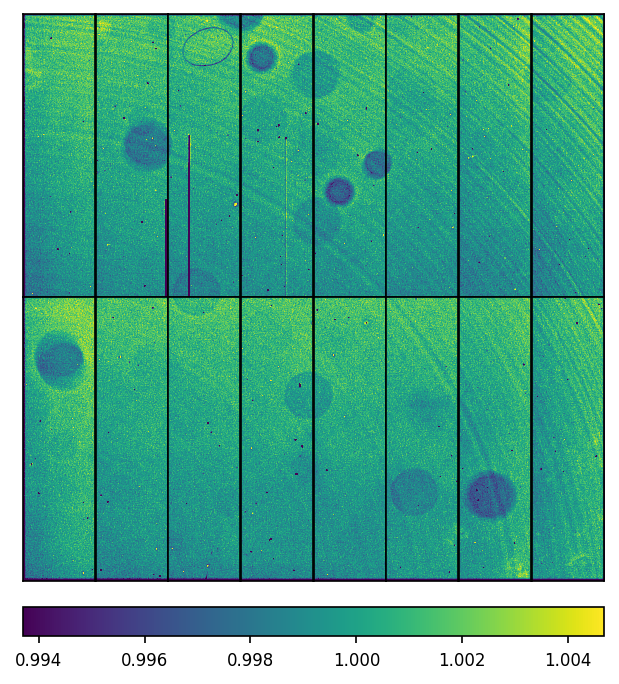

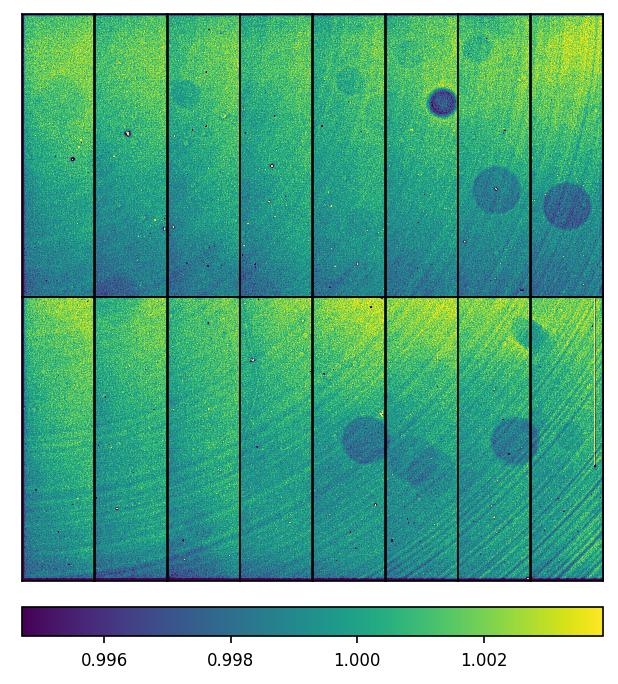

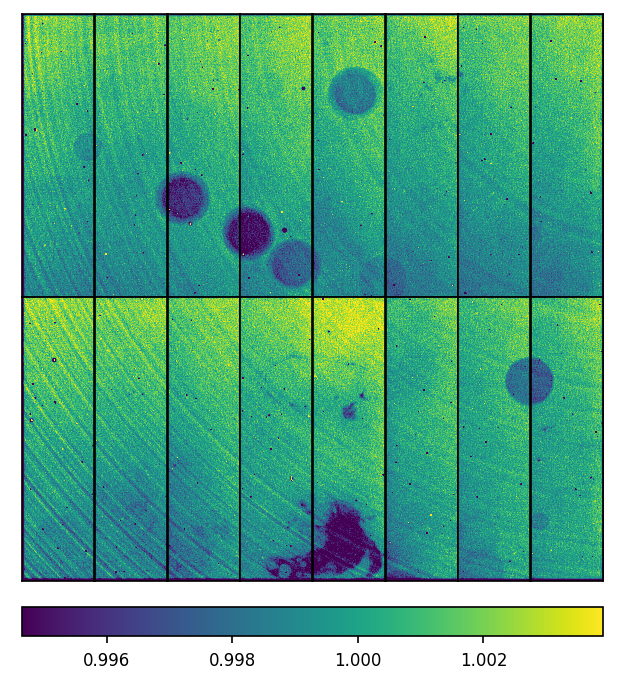

In [5]:
normedimg_arr_list = []
red_arr_list = []
img_list_list = []

title = ''
for i in range(num_CCDs):
    img_list = create_combined_ITL(superdarkpath_list[i], superbiaspath_list[i], qeflatpath_list[i], weights_list[i], title)    # create_combined returns img_list at end of function, 
    img_list_list.append(img_list)                                                                                                                            # DOES NOT DISPLAY FLAT

for i in range(len(file_list)):
    create_ccob(img_list_list[i], i)
    normedimg_arr, red_arr = create_ccob(img_list_list[i], i)
    normedimg_arr_list.append(normedimg_arr)          # creates lists of stored QE flat data for each CCD (of 9) to make COMBINED
    red_arr_list.append(red_arr)                      # and CCOB red band

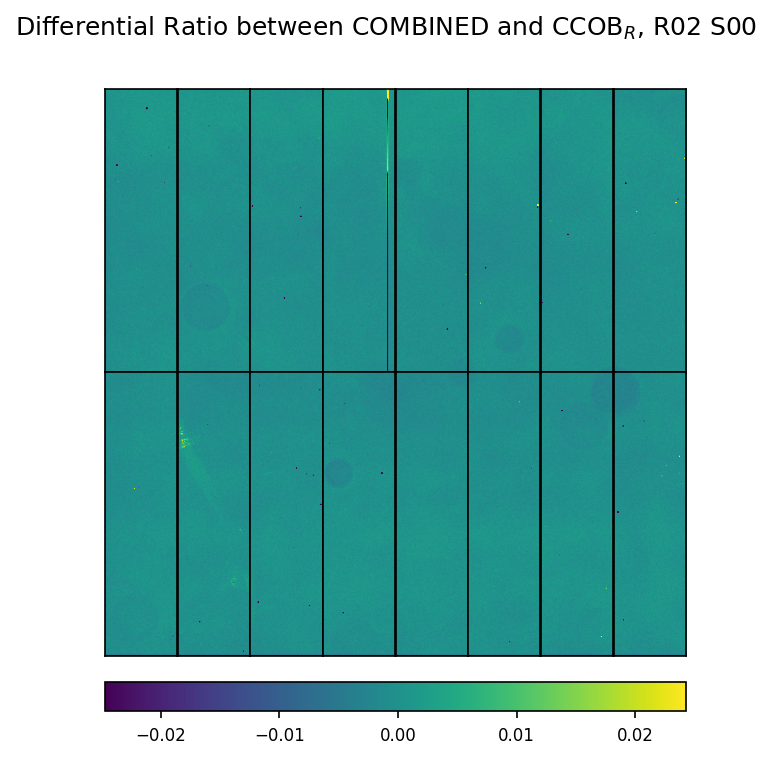

<Figure size 432x288 with 0 Axes>

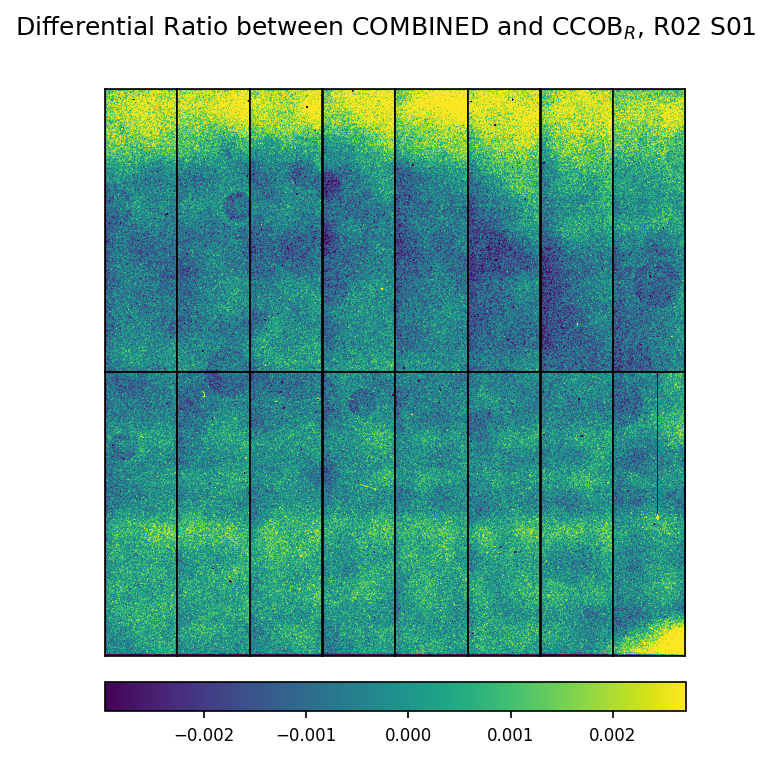

<Figure size 432x288 with 0 Axes>

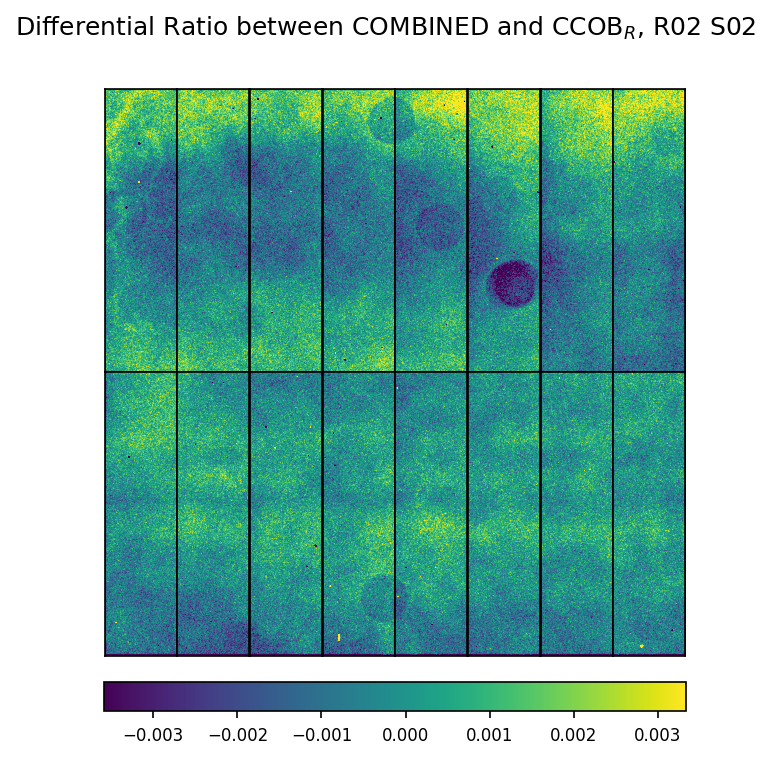

<Figure size 432x288 with 0 Axes>

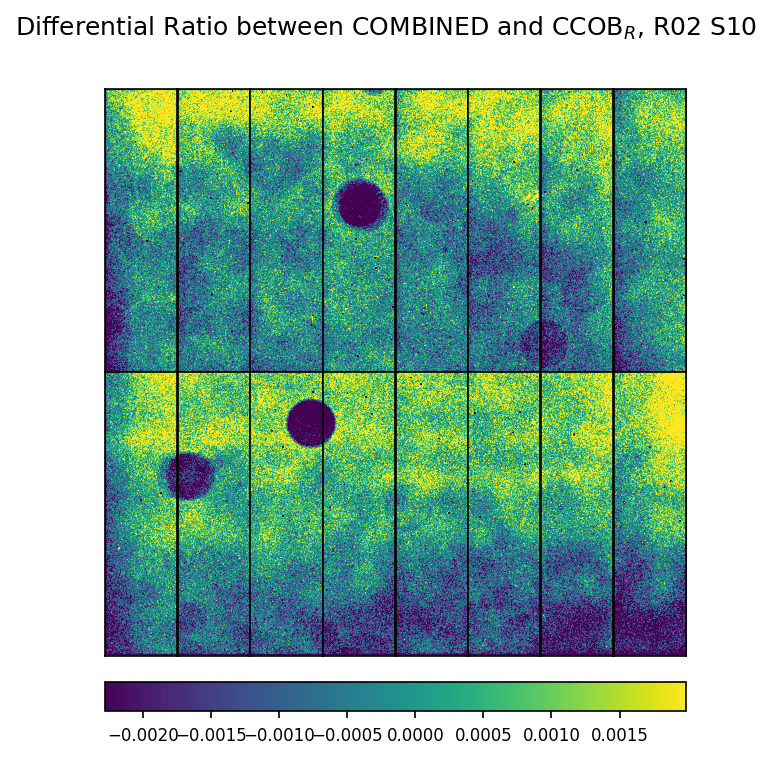

<Figure size 432x288 with 0 Axes>

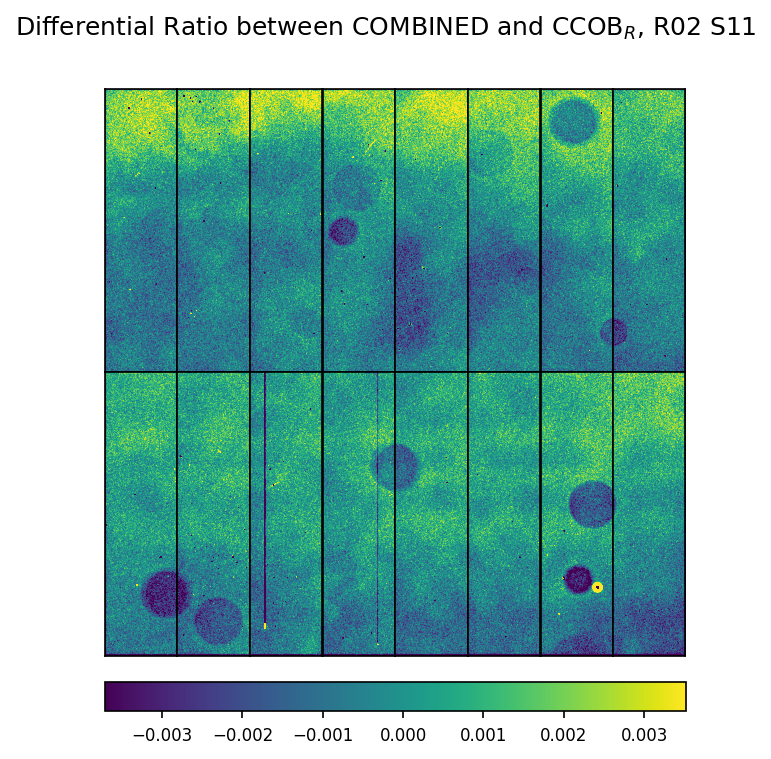

<Figure size 432x288 with 0 Axes>

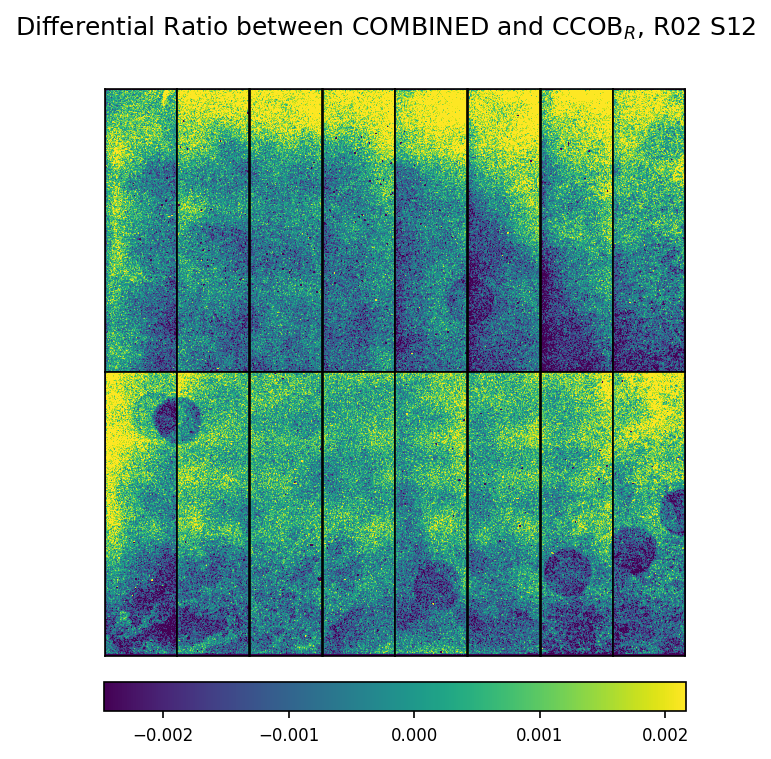

<Figure size 432x288 with 0 Axes>

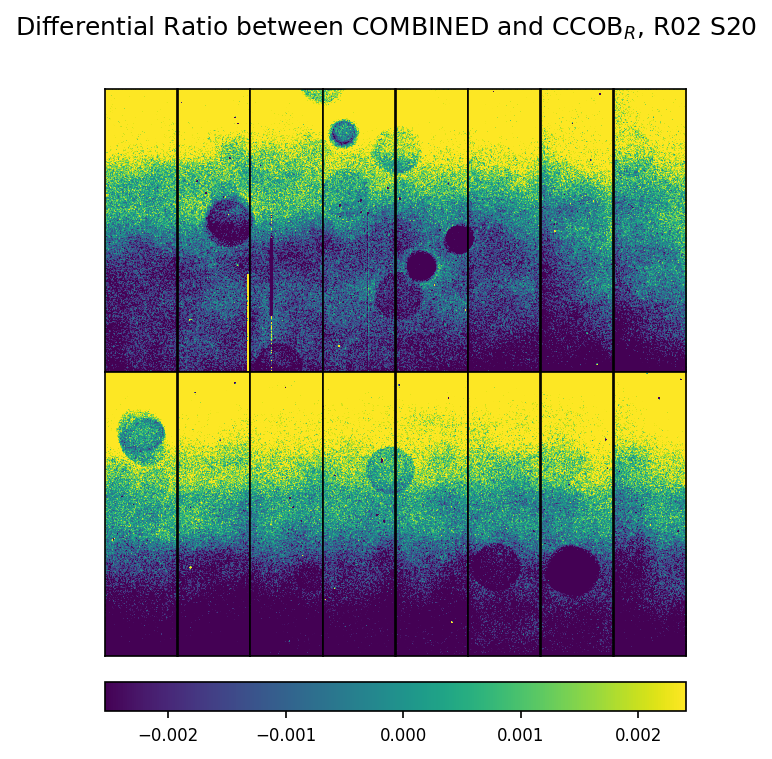

<Figure size 432x288 with 0 Axes>

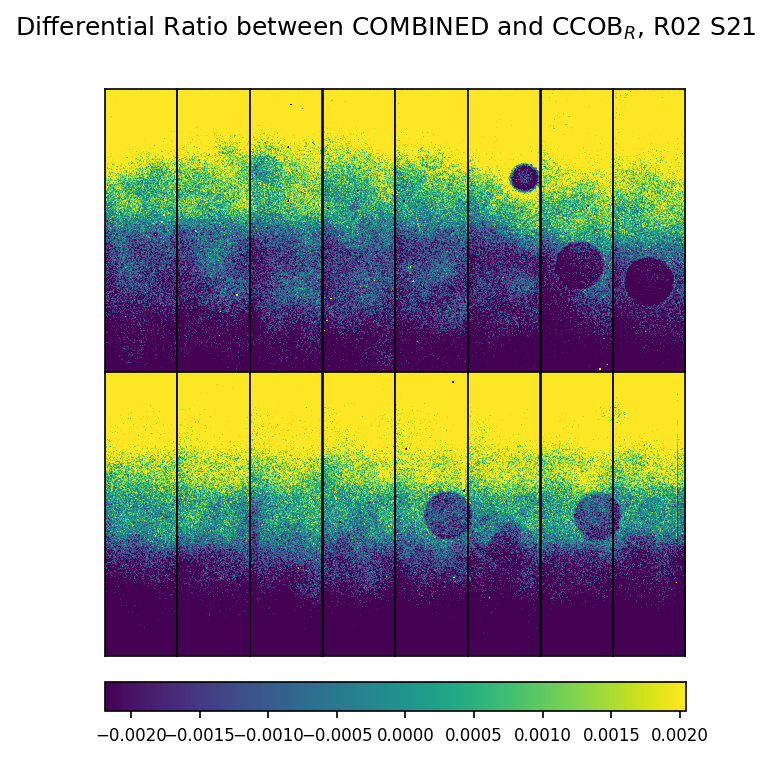

<Figure size 432x288 with 0 Axes>

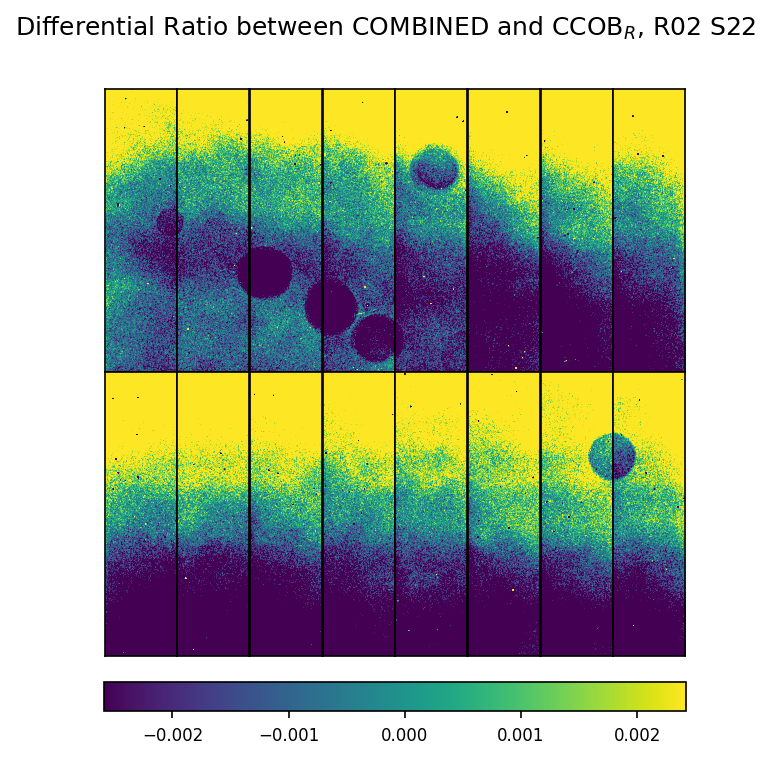

['R02_S01.png', 'R02_S00.png', 'R02_S22.png', 'R02_S11.png', 'R02_S12.png', 'R02_S20.png', 'R02_S10.png', 'R02_S21.png', 'R02_S02.png']


<Figure size 432x288 with 0 Axes>

In [14]:
num_ch = 16
num_CCDs = 9
sensor_label = ['S00', 'S01', 'S02', 'S10', 'S11', 'S12', 'S20', 'S21', 'S22']
ratio_img_list = []
for i in range(num_CCDs):
    diff_arr = [None] * num_ch
    for ch in range(num_ch):
        diff_arr[ch] = (normedimg_arr_list[i][ch] - red_arr_list[i][ch]) / red_arr_list[i][ch]
    plotonesensor_ITL(diff_arr, 'Differential Ratio between COMBINED and CCOB$_{R}$, R02 ' + str(sensor_label[i]))
    plt.savefig("R02_" + str(sensor_label[i]) + ".png")


#for file in directory:
    #ratio_img_list.append(file)
    
import glob, os
os.chdir("/home/lpayne22/WORK/ITL_flats")
for file in glob.glob("*.png"):
    ratio_img_list.append(file)
print(ratio_img_list)

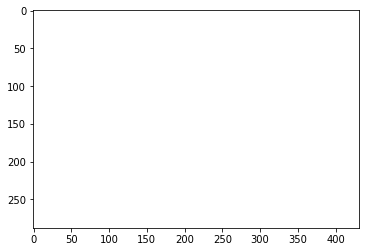

In [17]:
import matplotlib.image as mpimg
img=mpimg.imread('R02_S22.png')
imgplot = plt.imshow(img)
plt.show()

TypeError: Image data of dtype <U11 cannot be converted to float

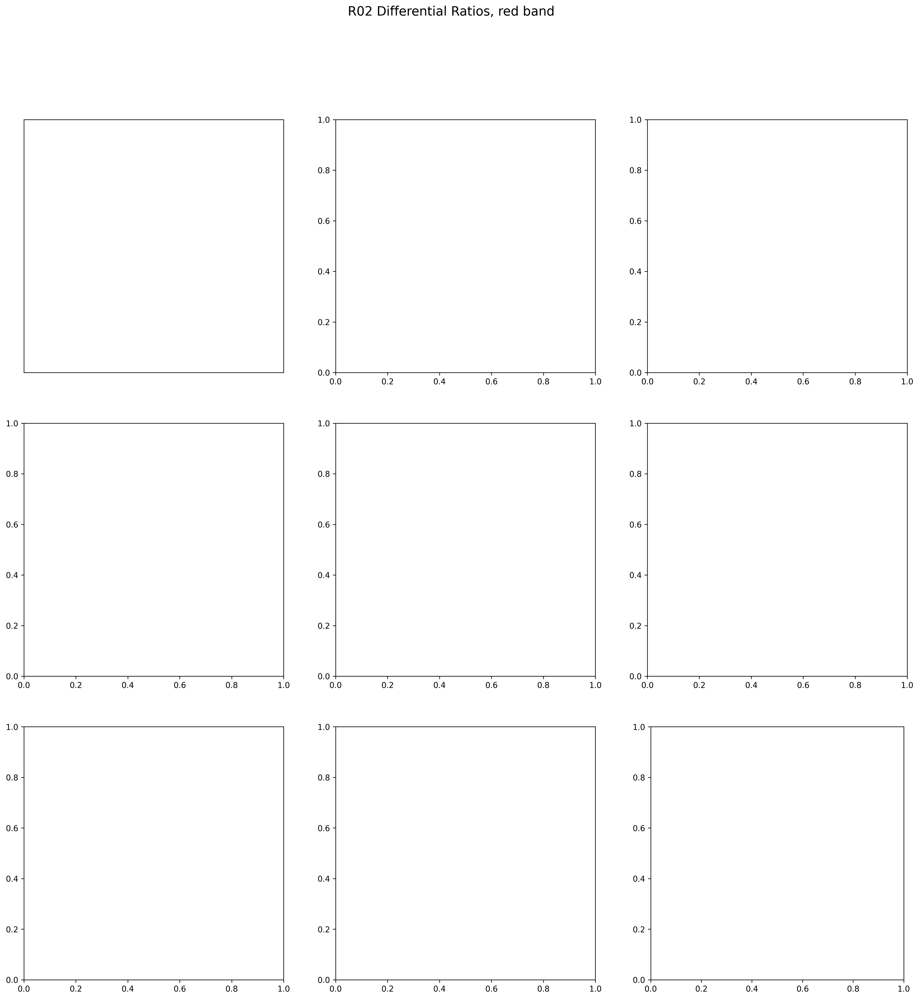

In [10]:
num_ch = 16
num_CCDs = 9
sensor_label = ['S00', 'S01', 'S02', 'S10', 'S11', 'S12', 'S20', 'S21', 'S22']

fig, axs = plt.subplots(3, 3, figsize=(20, 20),dpi=300) 
rows = 3   
columns = 3
axs = axs.ravel()

fig.suptitle('R02 Differential Ratios, red band', fontsize=16)
#fig.text(0.5, 0.0, "Variation of QE (%)", ha='center', fontsize=16)
#fig.text(-0.02, 0.5, "number of pixels  / %.2e" % width, va='center', rotation='vertical', fontsize=16)
ax = []
for i in range(num_CCDs):
    #ax1 = fig.add_subplot(rows, columns, i + 1)
    #ax.append(ax1)
    axs[i].set_xticks([])   
    axs[i].set_yticks([])
    image = ratio_img_list[i]
    plt.imshow(image)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


"""
for i in range(num_ch):
        

        ax1 = fig.add_subplot(rows, columns, i + 1)
        ax.append(ax1)
        ax1.set_xticks([])   
        ax1.set_yticks([])

        N = 0.3
        im = plt.imshow(image_com, vmin=mean-N*std,vmax=mean+N*std,origin="lower")
        
    plt.suptitle(title)
    cbar = fig.colorbar(im, ax=ax, orientation="horizontal", anchor=(0,-1))
    cbar.ax.tick_params(labelsize=8)
    fig.subplots_adjust(wspace=0, hspace=0)
    plt.show()
"""